In [ ]:
!pip install urllib3
!pip install spacy
!python3 -m spacy download en_core_web_sm
!pip install nltk
!pip install beautifulsoup4
!pip install textacy
!pip install feedparser
!pip install pyLDAvis
!pip uninstall pandas
!pip install pandas==1.3.4

     |████████████████████████████████| 12.0 MB 5.1 MB/s 
✔ Download and installation successful
You can now load the model via spacy.load('en_core_web_sm')
     |████████████████████████████████| 200 kB 5.3 MB/s 
     |████████████████████████████████| 2.0 MB 48.3 MB/s 
     |████████████████████████████████| 6.0 MB 31.3 MB/s 
     |████████████████████████████████| 481 kB 62.8 MB/s 
     |████████████████████████████████| 132 kB 51.2 MB/s 
     |████████████████████████████████| 42 kB 1.3 MB/s 
     |████████████████████████████████| 181 kB 59.5 MB/s 
     |████████████████████████████████| 628 kB 72.0 MB/s 
     |████████████████████████████████| 10.1 MB 42.1 MB/s 
     |████████████████████████████████| 451 kB 51.0 MB/s 
  Created wheel for cytoolz: filename=cytoolz-0.11.2-cp37-cp37m-linux_x86_64.whl size=1230820 sha256=39306bec28ae860ba6256082017a9e5f3e01f7f6b61657377f63cea182fd3764
  Stored in directory: /root/.cache/pip/wheels/38/70/71/ca13ea3d36ccd0b3d0ec7d7a4ca67522048d695b556

Found existing installation: pandas 1.3.5
Uninstalling pandas-1.3.5:
  Would remove:
    /usr/local/lib/python3.7/dist-packages/pandas-1.3.5.dist-info/*
    /usr/local/lib/python3.7/dist-packages/pandas/*
Proceed (y/n)? y
  Successfully uninstalled pandas-1.3.5
     |████████████████████████████████| 11.3 MB 4.8 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires pandas~=1.1.0; python_version >= "3.0", but you have pandas 1.3.4 which is incompatible.


In [ ]:
# Suppress Warnings
import warnings
warnings.filterwarnings('ignore')

#Import the necessary packages
import pickle
import pandas as pd
import numpy as np
from datetime import datetime
import nltk
nltk.download('wordnet')
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('averaged_perceptron_tagger')
from nltk.tokenize import word_tokenize
from nltk.tokenize import sent_tokenize
from nltk.stem import WordNetLemmatizer, SnowballStemmer
from nltk.corpus import stopwords
import gensim
from gensim.utils import simple_preprocess
from gensim.corpora.dictionary import Dictionary
import gensim.corpora as corpora
from gensim.models import CoherenceModel
from gensim.models.ldamodel import LdaModel
#import spacy
import string
import re
import pyLDAvis
import pyLDAvis.gensim_models
import matplotlib.pyplot as plt
import matplotlib.font_manager
from sklearn.feature_extraction.text import TfidfVectorizer

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.


/usr/local/lib/python3.7/dist-packages/past/types/oldstr.py:5: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working
  from collections import Iterable


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# New Section

In [ ]:
#Load the krebs dataset (saved as a pickle file) into a dataframe df
import pandas as pd

df = pd.read_csv("/content/drive/MyDrive/CS F366/2010-2019-dataset.csv")
df.tail()

,Authors,Author(s) ID,Title,Year,Source title,Volume,Issue,Art. No.,Page start,Page end,Page count,Cited by,DOI,Link,Abstract,Document Type,Publication Stage,Open Access,Source,EID
6674,Khan M.,57210788369;,Cybersecurity considerations for industrial Io...,2019,ISA at Montreal Symposium 2018,NaN,NaN,NaN,25,37,NaN,NaN,NaN,https://www.scopus.com/inward/record.uri?eid=2...,[No abstract available],Conference Paper,Final,NaN,Scopus,2-s2.0-85071461626
6675,[No author name available],[No author id available],IDIMT 2019: Innovation and Transformation in a...,2019,IDIMT 2019: Innovation and Transformation in a...,NaN,NaN,NaN,NaN,NaN,450.0,NaN,NaN,https://www.scopus.com/inward/record.uri?eid=2...,The proceedings contain 48 papers. The topics ...,Conference Review,Final,NaN,Scopus,2-s2.0-85071461159
6676,[No author name available],[No author id available],ISA at Montreal Symposium 2018,2019,ISA at Montreal Symposium 2018,NaN,NaN,NaN,NaN,NaN,61.0,NaN,NaN,https://www.scopus.com/inward/record.uri?eid=2...,The proceedings contain 4 papers. The topics d...,Conference Review,Final,NaN,Scopus,2-s2.0-85071453485
6677,[No author name available],[No author id available],4th International Conference on Interactive Co...,2019,Lecture Notes in Computer Science (including s...,11659 LNAI,NaN,NaN,NaN,NaN,340.0,NaN,NaN,https://www.scopus.com/inward/record.uri?eid=2...,The proceedings contain 32 papers. The special...,Conference Review,Final,NaN,Scopus,2-s2.0-85071453246
6678,Ahmad M.,57193334182;,Processors tackle cybersecurity in connected cars,2019,Electronic Products,61,7,NaN,13,15,NaN,NaN,NaN,https://www.scopus.com/inward/record.uri?eid=2...,[No abstract available],Article,Final,NaN,Scopus,2-s2.0-85071322483


In [ ]:
df = df[["Title", "Abstract","Year"]]
df1=pd.read_csv("/content/drive/MyDrive/CS F366/2020-dataset.csv")
df1=df1[["Title","Abstract","Year"]]
df=df.append(df1)
df1=pd.read_csv("/content/drive/MyDrive/CS F366/2021-dataset.csv")
df1=df1[["Title","Abstract","Year"]]
df=df.append(df1)
df1.tail()

,Title,Abstract,Year
1995,Taxonomy of Cybersecurity Awareness Delivery M...,Phishing is a serious threat to the Internet u...,2021
1996,A systems engineering approach to developing a...,"Additive manufacturing (AM), also known as thr...",2021
1997,Noise-response analysis of deep neural network...,"The ubiquity of deep neural networks (DNNs), c...",2021
1998,Is cyber-security the new lifeboat? An explora...,After the International Maritime Organisation ...,2021
1999,Governing online terrorist propaganda: A socie...,There is an increasing threat posed by terrori...,2021


In [ ]:
#Inspect the dataframe
print(len(df.index))


10679


In [ ]:
df['Abstract']

0       Increasing complexity of power grids, growing ...
1       Although researchers have spent considerable t...
2       Disruption of electric power operations can be...
3       Existing and forthcoming devices at the reside...
4       Since 2004, the DETER Cybersecurity Testbed Pr...
                              ...                        
1995    Phishing is a serious threat to the Internet u...
1996    Additive manufacturing (AM), also known as thr...
1997    The ubiquity of deep neural networks (DNNs), c...
1998    After the International Maritime Organisation ...
1999    There is an increasing threat posed by terrori...
Name: Abstract, Length: 10679, dtype: object

In [ ]:
#Define a function that removes urls from text using regex
def remove_urls(text):
    URLess_string = re.sub(r'\w+:\/{2}[\d\w-]+(\.[\d\w-]+)*(?:(?:\/[^\s/]*))*', '', text)
    return URLess_string

In [ ]:
#Define a function that removes punctuation from the text which may impact the model's ability to extract topics
def remove_punctuation(text):
    no_punct = re.sub(r'[^\w\s]', '', text)
    return no_punct

In [ ]:
#Apply the remove url function to the body series
df['Abstract'] = df['Abstract'].apply(lambda x: remove_urls(x))

In [ ]:
#Apply the remove punctuation function to the body series
df['Abstract'] = df['Abstract'].apply(lambda x: remove_punctuation(x))

In [ ]:
print(df.head())

                                               Title  ...  Year
0        A reliability perspective of the smart grid  ...  2010
1                         Smart-grid security issues  ...  2010
2  Cybersecurity for critical infrastructures: At...  ...  2010
3  An authenticated control framework for distrib...  ...  2010
4  The DETER project: Advancing the science of cy...  ...  2010

[5 rows x 3 columns]


Improving Interpretability using n-grams:

In [ ]:
# Added on 25-11
bigram_measures = nltk.collocations.BigramAssocMeasures()
finder = nltk.collocations.BigramCollocationFinder.from_documents([comment.split() for comment in df.Abstract])
# Filter only those that occur at least 10 times
finder.apply_freq_filter(10)
bigram_scores = finder.score_ngrams(bigram_measures.pmi)

In [ ]:
# added on 25-11
trigram_measures = nltk.collocations.TrigramAssocMeasures()
finder = nltk.collocations.TrigramCollocationFinder.from_documents([comment.split() for comment in df.Abstract])
# Filter only those that occur at least 50 times
finder.apply_freq_filter(5)
trigram_scores = finder.score_ngrams(trigram_measures.pmi)


In [ ]:
bigram_pmi = pd.DataFrame(bigram_scores)
bigram_pmi.columns = ['bigram', 'pmi']
bigram_pmi.sort_values(by='pmi', axis = 0, ascending = False, inplace = True)

In [ ]:
trigram_pmi = pd.DataFrame(trigram_scores)
trigram_pmi.columns = ['trigram', 'pmi']
trigram_pmi.sort_values(by='pmi', axis = 0, ascending = False, inplace = True)

In [ ]:
# Filter for bigrams with only noun-type structures
def bigram_filter(bigram):
    tag = nltk.pos_tag(bigram)
    if tag[0][1] not in ['JJ', 'NN'] and tag[1][1] not in ['NN']:
        return False
    if bigram[0] in stopwords.words('english') or bigram[1] in stopwords.words('english'):
        return False
    if 'n' in bigram or 't' in bigram:
        return False
    if 'PRON' in bigram:
        return False
    return True

In [ ]:
def trigram_filter(trigram):
    tag = nltk.pos_tag(trigram)
    if tag[0][1] not in ['JJ', 'NN'] and tag[1][1] not in ['JJ','NN']:
        return False
    if trigram[0] in stopwords.words('english') or trigram[-1] in stopwords.words('english') or trigram[1] in stopwords.words('english'):
        return False
    if 'n' in trigram or 't' in trigram:
         return False
    if 'PRON' in trigram:
        return False
    return True 

In [ ]:
# Can set pmi threshold to whatever makes sense - eyeball through and select threshold where n-grams stop making sense
# choose top 500 ngrams in this case ranked by PMI that have noun like structures
filtered_bigram = bigram_pmi[bigram_pmi.apply(lambda bigram: bigram_filter(bigram['bigram']) and bigram.pmi > 5, axis = 1)][:500]

filtered_trigram = trigram_pmi[trigram_pmi.apply(lambda trigram: trigram_filter(trigram['trigram']) and trigram.pmi > 5, axis = 1)][:500]


bigrams = [' '.join(x) for x in filtered_bigram.bigram.values if len(x[0]) > 2 or len(x[1]) > 2]
trigrams = [' '.join(x) for x in filtered_trigram.trigram.values if len(x[0]) > 2 or len(x[1]) > 2 and len(x[2]) > 2]

In [ ]:
bigrams[:10]

['Mechanical Turk',
 'crosssite scripting',
 'Principal Component',
 'substitution boxes',
 'Logistic Regression',
 'Gated Recurrent',
 'Augmented Reality',
 'Elliptic Curve',
 'Logic Controllers',
 'Own Device']

In [ ]:
trigrams[:10]

['Bidirectional Encoder Representations',
 'thermally radiative casson',
 'Synthetic Minority Oversampling',
 'Latent Dirichlet Allocation',
 'heat generationabsorption pulsating',
 'Sistemas e Tecnologias',
 'radiative casson fluid',
 'Stochastic Gradient Descent',
 'Arab Emirates UAE',
 'ElectricalElectronicProgrammable Electronic Safetyrelated']

In [ ]:
# Concatenate n-grams
def replace_ngram(x):
    for gram in trigrams:
        x = x.replace(gram, '_'.join(gram.split()))
    for gram in bigrams:
        x = x.replace(gram, '_'.join(gram.split()))
    return x

In [ ]:
reviews_w_ngrams = df.copy()

In [ ]:
reviews_w_ngrams.Abstract = reviews_w_ngrams.Abstract.map(lambda x: replace_ngram(x))

In [ ]:
# tokenize reviews + remove stop words + remove names + remove words with less than 2 characters
# english_names not implemented
reviews_w_ngrams = reviews_w_ngrams.Abstract.map(lambda x: [word for word in x.split() if word not in stopwords.words('english') and len(word) > 2 and word not in ['cybersecurity','information','security','cyber','research','paper','study','article']])

In [ ]:
reviews_w_ngrams.head()

0    [Increasing, complexity, power, grids, growing...
1    [Although, researchers, spent, considerable, t...
2    [Disruption, electric, power, operations, cata...
3    [Existing, forthcoming, devices, residential, ...
4    [Since, 2004, DETER, Cybersecurity, Testbed, P...
Name: Abstract, dtype: object

In [ ]:
# Filter for only nouns
def noun_only(x):
    pos_comment = nltk.pos_tag(x)
    filtered = [word[0] for word in pos_comment if word[1] in ['NN']]
    # to filter both noun and verbs
    #filtered = [word[0] for word in pos_comment if word[1] in ['NN','VB', 'VBD', 'VBG', 'VBN', 'VBZ']]
    return filtered

In [ ]:
final_reviews = reviews_w_ngrams.map(noun_only)
df['Abstract']=final_reviews
# final_reviews.head()
df.head()

,Title,Abstract,Year
0,A reliability perspective of the smart grid,"[complexity, power, demand, requirement, relia...",2010
1,Smart-grid security issues,"[time, review, authentication, encryption]",2010
2,Cybersecurity for critical infrastructures: At...,"[power, economy, complexity, computer, communi...",2010
3,An authenticated control framework for distrib...,"[level, ability, power, support, generation, e...",2010
4,The DETER project: Advancing the science of cy...,"[infrastructure, resource, experimentation, ne...",2010


In [ ]:
#Define a function that takes input string, converts it all to lower case then tokenizes it using nltk.tokenize
def word_tokenizer(text):
    tokens = nltk.word_tokenize(text.lower())
    return tokens

In [ ]:
df.head()

,Title,Abstract,Year
0,A reliability perspective of the smart grid,"[complexity, power, demand, requirement, relia...",2010
1,Smart-grid security issues,"[time, review, authentication, encryption]",2010
2,Cybersecurity for critical infrastructures: At...,"[power, economy, complexity, computer, communi...",2010
3,An authenticated control framework for distrib...,"[level, ability, power, support, generation, e...",2010
4,The DETER project: Advancing the science of cy...,"[infrastructure, resource, experimentation, ne...",2010


In [ ]:
#Save the preprocessed data to a pickle file: 'df_preprocessed.pickle'
with open('df_preprocessed.pickle', 'wb') as f:
    pickle.dump(df, f)

In [ ]:
# df.index = pd.to_datetime(df.index)
#df = df.sort_index()

#df.head()

#df = df['2019-12-31':]
# print(df.size())

In [ ]:
# Create a dictionary of all unique tokens by passing df.Body to the Dictionary method
df.count
dictionary = corpora.Dictionary(df.Abstract)


In [ ]:
#Each unique token is mapped to an id number e.g. 'chip': 140
#dictionary.token2id

In [ ]:
#Turn the dictionary into a corpus (a Bag of Words) that contains the word id and its frequency in each document (article in our case)
texts = df.Abstract
corpus = [dictionary.doc2bow(text) for text in texts]

In [ ]:
# Create a dictionary of all unique tokens by passing df.Title to the Dictionary method
#dictionary_from_titles = corpora.Dictionary(df.Title)

In [ ]:
#Turn the dictionary into a corpus (a Bag of Words) that contains the word id and its frequency in each document (article in our case)
#texts_from_titles = df.Title
#corpus_from_titles = [dictionary_from_titles.doc2bow(text) for text in texts_from_titles]

In [ ]:
#Create an LDA model from the Body corpus which extracts 10 topics
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus, id2word=dictionary, num_topics=10, random_state=42, update_every=1, chunksize=1000, passes=20, iterations=400, alpha='auto', per_word_topics=True)

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

In [ ]:
lda_model.print_topics()

[(0,
  '0.114*"malware" + 0.060*"health" + 0.056*"healthcare" + 0.028*"ransomware" + 0.025*"fraud" + 0.019*"smart_city" + 0.013*"consumer" + 0.009*"payment" + 0.009*"breach" + 0.008*"device"'),
 (1,
  '0.058*"game" + 0.048*"authentication" + 0.047*"cyberspace" + 0.024*"insider" + 0.016*"identity" + 0.016*"theory" + 0.015*"legislation" + 0.014*"exercise" + 0.013*"policy" + 0.012*"password"'),
 (2,
  '0.116*"risk" + 0.085*"threat" + 0.052*"management" + 0.040*"vulnerability" + 0.037*"assessment" + 0.027*"intelligence" + 0.025*"organization" + 0.021*"space" + 0.013*"loss" + 0.013*"compliance"'),
 (3,
  '0.088*"software" + 0.059*"safety" + 0.041*"engineering" + 0.040*"education" + 0.035*"design" + 0.027*"program" + 0.026*"project" + 0.026*"vehicle" + 0.022*"hardware" + 0.021*"course"'),
 (4,
  '0.143*"privacy" + 0.026*"breach" + 0.017*"surveillance" + 0.015*"feature_selection" + 0.013*"email" + 0.013*"disclosure" + 0.012*"trade" + 0.011*"questionnaire" + 0.010*"phishing" + 0.010*"conflict"

In [ ]:
print('\nPerplexity for Corpus from Body: ', lda_model.log_perplexity(corpus) )
#print('\nPerplexity for Corpus from Titles: ', lda_model_from_titles.log_perplexity(corpus_from_titles) )

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt


Perplexity for Corpus from Body:  -7.135232410212349


/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for

In [ ]:
coherence_model_lda_body = CoherenceModel(model=lda_model, texts=df.Abstract, dictionary=dictionary, coherence='c_v')
coherence_lda_body = coherence_model_lda_body.get_coherence()
print('\nCoherence score from Body: ', coherence_lda_body)


Coherence score from Body:  0.4327122215827674


In [ ]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.ldamodel.LdaModel(corpus=corpus, id2word=dictionary, num_topics=num_topics, random_state=42, update_every=1, chunksize=1000, passes=20, iterations=400, alpha='auto', per_word_topics=True)
        model_list.append(model)
        coherence_model = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherence_model.get_coherence())
        
    return model_list, coherence_values

In [ ]:
model_list, coherence_values = compute_coherence_values(dictionary=dictionary, corpus=corpus, texts=df.Abstract, limit=30, start=2, step=2)

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

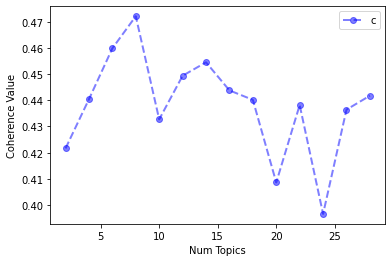

<Figure size 432x288 with 0 Axes>

In [ ]:
limit=30; start=2; step=2;
x = range(start, limit, step)
plt.plot(x, coherence_values, 'bo--', linewidth=2, markersize=6, alpha=0.5)
plt.xlabel("Num Topics")
plt.ylabel("Coherence Value")
plt.legend(("coherence_values"), loc='best')
#plt.title('Coherence Value as a function of topic numbers\n from Krebsonsecurity Title Corpus')
plt.show()
plt.savefig('Coherence_values')

In [ ]:
 for m, cv in zip(x, coherence_values):
    print('Num Topics =', m, 'has Coherence ValueErrorlue of', round(cv,4))

Num Topics = 2 has Coherence ValueErrorlue of 0.4216
Num Topics = 4 has Coherence ValueErrorlue of 0.4404
Num Topics = 6 has Coherence ValueErrorlue of 0.4598
Num Topics = 8 has Coherence ValueErrorlue of 0.4721
Num Topics = 10 has Coherence ValueErrorlue of 0.4327
Num Topics = 12 has Coherence ValueErrorlue of 0.4494
Num Topics = 14 has Coherence ValueErrorlue of 0.4545
Num Topics = 16 has Coherence ValueErrorlue of 0.4438
Num Topics = 18 has Coherence ValueErrorlue of 0.4402
Num Topics = 20 has Coherence ValueErrorlue of 0.4086
Num Topics = 22 has Coherence ValueErrorlue of 0.4382
Num Topics = 24 has Coherence ValueErrorlue of 0.3966
Num Topics = 26 has Coherence ValueErrorlue of 0.4364
Num Topics = 28 has Coherence ValueErrorlue of 0.4418


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

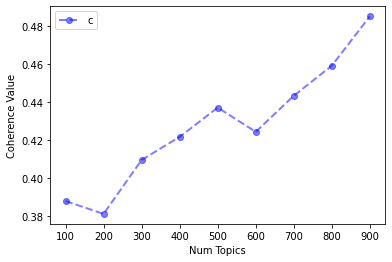

Num Topics = 100 has Coherence ValueErrorlue of 0.3881
Num Topics = 200 has Coherence ValueErrorlue of 0.3813
Num Topics = 300 has Coherence ValueErrorlue of 0.4097
Num Topics = 400 has Coherence ValueErrorlue of 0.4218
Num Topics = 500 has Coherence ValueErrorlue of 0.4372
Num Topics = 600 has Coherence ValueErrorlue of 0.4245
Num Topics = 700 has Coherence ValueErrorlue of 0.4435
Num Topics = 800 has Coherence ValueErrorlue of 0.4593
Num Topics = 900 has Coherence ValueErrorlue of 0.4853


<Figure size 432x288 with 0 Axes>

In [ ]:
# Chunksize
def compute_coherence_values_chunksize(dictionary, corpus, texts, limit, start=2, step=3):
    coherence_values = []
    model_list = []
    for chunksize in range(start, limit, step):
        model = gensim.models.ldamodel.LdaModel(corpus=corpus, id2word=dictionary, num_topics=8, random_state=42, update_every=1, chunksize=chunksize, passes=20, iterations=400, alpha='auto', per_word_topics=True)
        model_list.append(model)
        coherence_model = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherence_model.get_coherence())
        
    return model_list, coherence_values
model_list, coherence_values = compute_coherence_values_chunksize(dictionary=dictionary, corpus=corpus, texts=df.Abstract, limit=1000, start=100, step=100)
limit=1000; start=100; step=100;
x = range(start, limit, step)
plt.plot(x, coherence_values, 'bo--', linewidth=2, markersize=6, alpha=0.5)
plt.xlabel("Chunksize")
plt.ylabel("Coherence Value")
plt.legend(("coherence_values"), loc='best')
#plt.title('Coherence Value as a function of topic numbers\n from Krebsonsecurity Title Corpus')
plt.show()
plt.savefig('Coherence_values')
for m, cv in zip(x, coherence_values):
  print('Chunksize =', m, 'has Coherence ValueErrorlue of', round(cv,4))

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

10


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

30


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

50


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

70


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

90


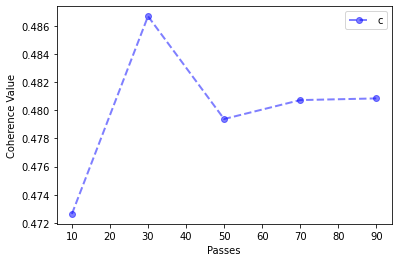

Passes = 10 has Coherence ValueErrorlue of 0.4726
Passes = 30 has Coherence ValueErrorlue of 0.4867
Passes = 50 has Coherence ValueErrorlue of 0.4794
Passes = 70 has Coherence ValueErrorlue of 0.4807
Passes = 90 has Coherence ValueErrorlue of 0.4808


<Figure size 432x288 with 0 Axes>

In [ ]:
# Passes
def compute_coherence_values_passes(dictionary, corpus, texts, limit, start=2, step=3):
    coherence_values = []
    model_list = []
    for passes in range(start, limit, step):
        model = gensim.models.ldamodel.LdaModel(corpus=corpus, id2word=dictionary, num_topics=8, random_state=42, update_every=1, chunksize=900, passes=passes, iterations=400, alpha='auto', per_word_topics=True)
        model_list.append(model)
        coherence_model = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherence_model.get_coherence())
        print(passes)
    return model_list, coherence_values
model_list, coherence_values = compute_coherence_values_passes(dictionary=dictionary, corpus=corpus, texts=df.Abstract, limit=100, start=10, step=20)
limit=100; start=10; step=20;
x = range(start, limit, step)
plt.plot(x, coherence_values, 'bo--', linewidth=2, markersize=6, alpha=0.5)
plt.xlabel("Passes")
plt.ylabel("Coherence Value")
plt.legend(("coherence_values"), loc='best')
#plt.title('Coherence Value as a function of topic numbers\n from Krebsonsecurity Title Corpus')
plt.show()
plt.savefig('Coherence_values')
for m, cv in zip(x, coherence_values):
  print('Passes =', m, 'has Coherence ValueErrorlue of', round(cv,4))

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

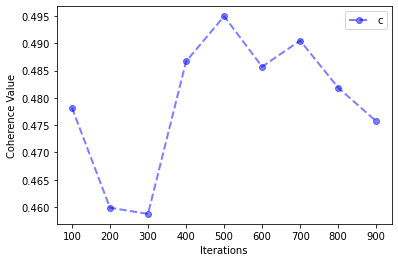

Iterations = 100 has Coherence ValueErrorlue of 0.4782
Iterations = 200 has Coherence ValueErrorlue of 0.4599
Iterations = 300 has Coherence ValueErrorlue of 0.4587
Iterations = 400 has Coherence ValueErrorlue of 0.4867
Iterations = 500 has Coherence ValueErrorlue of 0.495
Iterations = 600 has Coherence ValueErrorlue of 0.4857
Iterations = 700 has Coherence ValueErrorlue of 0.4905
Iterations = 800 has Coherence ValueErrorlue of 0.4819
Iterations = 900 has Coherence ValueErrorlue of 0.4757


<Figure size 432x288 with 0 Axes>

In [ ]:
# Iterations-------Chunksize=900, passes=30
def compute_coherence_values_Iterations(dictionary, corpus, texts, limit, start=2, step=3):
    coherence_values = []
    model_list = []
    for iterations in range(start, limit, step):
        model = gensim.models.ldamodel.LdaModel(corpus=corpus, id2word=dictionary, num_topics=8, random_state=42, update_every=1, chunksize=900, passes=30, iterations=iterations, alpha='auto', per_word_topics=True)
        model_list.append(model)
        coherence_model = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherence_model.get_coherence())
        
    return model_list, coherence_values
model_list, coherence_values = compute_coherence_values_Iterations(dictionary=dictionary, corpus=corpus, texts=df.Abstract, limit=1000, start=100, step=100)
limit=1000; start=100; step=100;
x = range(start, limit, step)
plt.plot(x, coherence_values, 'bo--', linewidth=2, markersize=6, alpha=0.5)
plt.xlabel("Iterations")
plt.ylabel("Coherence Value")
plt.legend(("coherence_values"), loc='best')
#plt.title('Coherence Value as a function of topic numbers\n from Krebsonsecurity Title Corpus')
plt.show()
plt.savefig('Coherence_values')
for m, cv in zip(x, coherence_values):
  print('Iterations =', m, 'has Coherence ValueErrorlue of', round(cv,4))

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

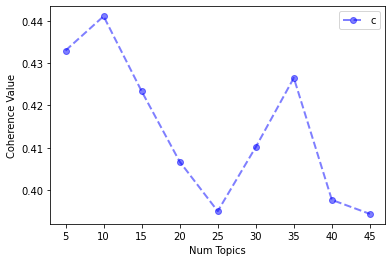

<Figure size 432x288 with 0 Axes>

In [ ]:
# Final optimized value chunksize=900 passes=30 iterations=500
def compute_coherence_values_final(dictionary, corpus, texts, limit, start=2, step=3):
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.ldamodel.LdaModel(corpus=corpus, id2word=dictionary, num_topics=num_topics, random_state=42, update_every=1, chunksize=900, passes=30, iterations=500, alpha='auto', per_word_topics=True)
        model_list.append(model)
        coherence_model = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherence_model.get_coherence())
        # print(passes)
    return model_list, coherence_values
model_list, coherence_values = compute_coherence_values_final(dictionary=dictionary, corpus=corpus, texts=df.Abstract, limit=50, start=5, step=5)
limit=50; start=5; step=5;
x = range(start, limit, step)
plt.plot(x, coherence_values, 'bo--', linewidth=2, markersize=6, alpha=0.5)
plt.xlabel("Num Topics")
plt.ylabel("Coherence Value")
plt.legend(("coherence_values"), loc='best')
#plt.title('Coherence Value as a function of topic numbers\n from Krebsonsecurity Title Corpus')
plt.show()
plt.savefig('Coherence_values')

In [ ]:
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus, id2word=dictionary, num_topics=11, random_state=42, update_every=1, chunksize=900, passes=30,iterations=500, alpha='auto', per_word_topics=True)
lda_model.print_topics()

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt

[(0,
  '0.070*"health" + 0.062*"healthcare" + 0.033*"ransomware" + 0.019*"fraud" + 0.017*"consumer" + 0.015*"email" + 0.012*"questionnaire" + 0.012*"consensus" + 0.012*"device" + 0.011*"solve"'),
 (1,
  '0.063*"policy" + 0.040*"government" + 0.038*"cyberspace" + 0.036*"space" + 0.033*"governance" + 0.027*"law" + 0.022*"economy" + 0.022*"chapter" + 0.020*"state" + 0.020*"insider"'),
 (2,
  '0.048*"blockchain" + 0.039*"protocol" + 0.039*"scheme" + 0.033*"encryption" + 0.022*"insurance" + 0.020*"memory" + 0.018*"message" + 0.017*"certification" + 0.017*"mission" + 0.016*"controller"'),
 (3,
  '0.095*"system" + 0.043*"control" + 0.035*"software" + 0.034*"process" + 0.032*"communication" + 0.029*"design" + 0.024*"safety" + 0.023*"infrastructure" + 0.022*"protection" + 0.021*"access"'),
 (4,
  '0.153*"privacy" + 0.036*"breach" + 0.032*"investment" + 0.018*"surveillance" + 0.016*"feature_selection" + 0.014*"harm" + 0.013*"disclosure" + 0.013*"trade" + 0.010*"firm" + 0.009*"mass"'),
 (5,
  '0.

In [ ]:
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, dictionary)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
5     -0.280899  0.119895       1        1  31.179134
6     -0.256888  0.077521       2        1  19.767926
3     -0.222325 -0.194204       3        1  16.953658
7      0.007139  0.194044       4        1   6.240281
10     0.047599  0.084167       5        1   6.225400
8      0.017675 -0.305845       6        1   5.237089
1      0.056312 -0.071806       7        1   4.445538
2      0.163234  0.031020       8        1   2.840993
9      0.142205  0.052518       9        1   2.485126
4      0.159850  0.026529      10        1   2.447422
0      0.166097 -0.013838      11        1   2.177433, topic_info=             Term         Freq        Total Category  logprob  loglift
47         system  5369.000000  5369.000000  Default  30.0000  30.0000
104          risk  2271.000000  2271.000000  Default  29.0000  29.0000
136       network  3879.000000  3879.000000  Default  28.0000  28.0000
30      detection  3350.000000  3350.000000  Default  27.0000  27.0000
135    management  1795.000000  1795.000000  Default  26.0000  26.0000
...           ...          ...          ...      ...      ...      ...
2407        pilot    50.489432    67.359390  Topic11  -4.7953   3.5387
243   competition    53.516927    89.428253  Topic11  -4.7370   3.3136
265          year    62.229619   175.532126  Topic11  -4.5862   2.7900
888        device    70.758762   508.994895  Topic11  -4.4578   1.8539
130        online    51.474982   386.808852  Topic11  -4.7759   1.8102

[468 rows x 6 columns], token_table=      Topic      Freq            Term
term                                 
2458      5  0.990598      acceptance
235       3  0.984729          access
235       4  0.002020          access
235      11  0.013130          access
516       9  0.968037  accountability
...     ...       ...             ...
234       1  0.998443           world
265       3  0.358909            year
265       4  0.199394            year
265      10  0.085454            year
265      11  0.353212            year

[567 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[6, 7, 4, 8, 11, 9, 2, 3, 10, 5, 1])

In [ ]:
#Save the lda model from body to a pickle file
with open('lda_body.pickle', 'wb') as f:
    pickle.dump(lda_model, f)

In [ ]:
# Sentence Coloring of N Sentences
print(corpus)
def topics_per_document(model, corpus, start=0, end=1):
    corpus_sel = corpus[start:end]
    dominant_topics = []
    topic_percentages = []
    for i, corp in enumerate(corpus_sel):
        topic_percs, wordid_topics, wordid_phivalues = model[corp]
        # print(model[corp])
        dominant_topic = sorted(topic_percs, key = lambda x: x[1], reverse=True)[0][0]
        dominant_topics.append((i, dominant_topic))
        topic_percentages.append(topic_percs)
    return(dominant_topics, topic_percentages)

dominant_topics, topic_percentages = topics_per_document(model=lda_model, corpus=corpus, end=-1)            

# Distribution of Dominant Topics in Each Document
df = pd.DataFrame(dominant_topics, columns=['Document_Id', 'Dominant_Topic'])
df_pre=df.iloc[:6679,:]
df_post=df.iloc[6679:,:]
print(df_pre)
print(df_post)

# #Original
dominant_topic_in_each_doc = df.groupby('Dominant_Topic').size()
df_dominant_topic_in_each_doc= dominant_topic_in_each_doc.to_frame(name='count').reset_index()

# Pre-covid dominant topic distribution
dominant_topic_in_each_doc_pre = df_pre.groupby('Dominant_Topic').size()
df_dominant_topic_in_each_doc_pre= dominant_topic_in_each_doc_pre.to_frame(name='count').reset_index()

# Post-covid dominant topic distribution
dominant_topic_in_each_doc_post = df_post.groupby('Dominant_Topic').size()
df_dominant_topic_in_each_doc_post= dominant_topic_in_each_doc_post.to_frame(name='count').reset_index()

# # Total Topic Distribution by actual weight Original
topic_weightage_by_doc = pd.DataFrame([dict(t) for t in topic_percentages])
print(topic_weightage_by_doc)
# topic_weightage_by_doc.to_csv('demo.csv')
df_topic_weightage_by_doc = topic_weightage_by_doc.sum().to_frame(name='count').reset_index()

# Pre-covid total topic distribution by actual weight
topic_weightage_by_doc_pre = topic_weightage_by_doc.iloc[:6679,:]
topic_weightage_by_doc_post=topic_weightage_by_doc.iloc[6679:,:]
# print(topic_weightage_by_doc.head())
# topic_weightage_by_doc.to_csv('demo.csv')
df_topic_weightage_by_doc_pre = topic_weightage_by_doc_pre.sum().to_frame(name='count').reset_index()
df_topic_weightage_by_doc_post=topic_weightage_by_doc_post.sum().to_frame(name='count').reset_index()

# Top 3 Keywords for each Topic
topic_top3words = [(i, topic) for i, topics in lda_model.show_topics(formatted=False) 
                                 for j, (topic, wt) in enumerate(topics) if j < 3]

df_top3words_stacked = pd.DataFrame(topic_top3words, columns=['topic_id', 'words'])
df_top3words = df_top3words_stacked.groupby('topic_id').agg(', \n'.join)
df_top3words.reset_index(level=0,inplace=True)

Output hidden; open in https://colab.research.google.com to view.

    Dominant_Topic  count
0                0     11
1                1     30
2                2      7
3                3    454
4                4      7
5                5   2339
6                6    997
7                7     22
8                8     69
9                9      6
10              10     57
    Dominant_Topic  count
0                0     18
1                1    100
2                2     16
3                3    824
4                4     27
5                5   4434
6                6   1042
7                7     38
8                8     98
9                9     17
10              10     65


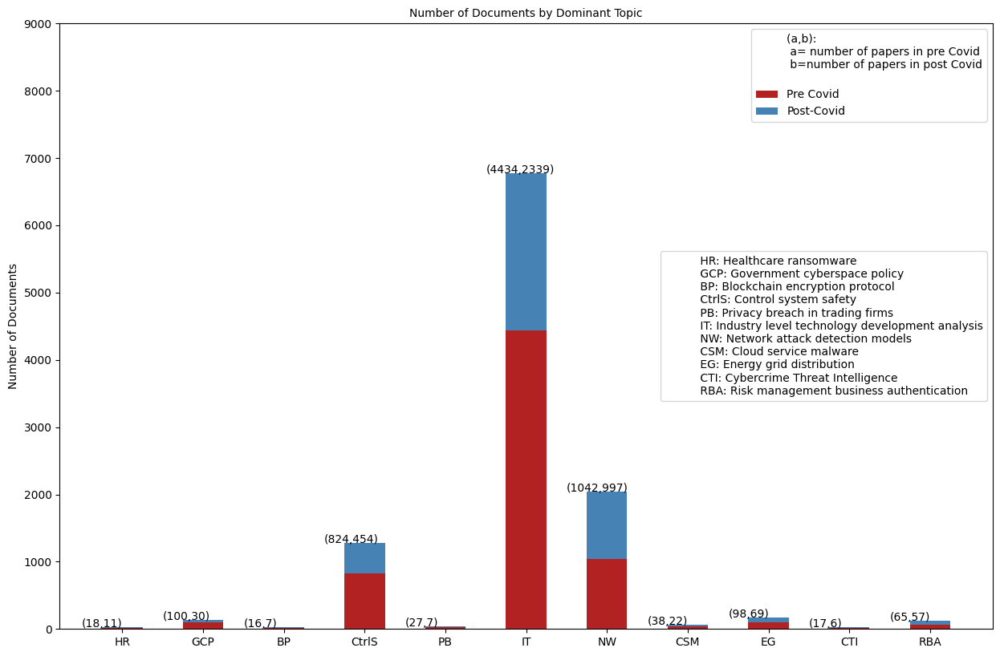

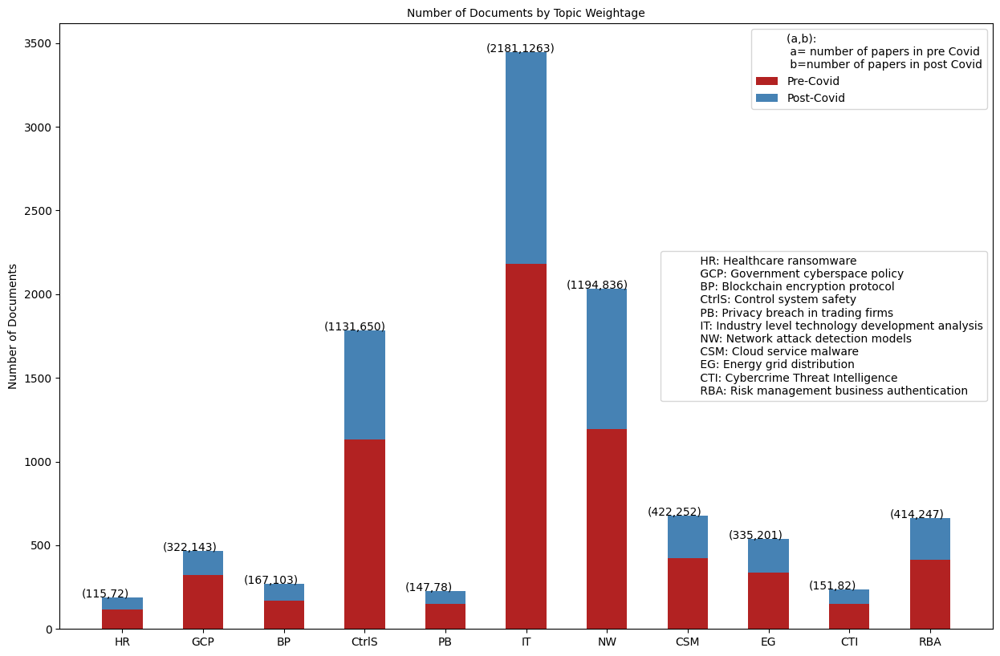

In [ ]:
# Plot
from matplotlib.ticker import FuncFormatter
fig, (ax1) = plt.subplots(1, 1, figsize=(15, 10),dpi=100, sharey=False)
fig1, (ax2)=plt.subplots(1, 1, figsize=(15, 10), dpi=100,sharey=False)
# Topic Distribution by Dominant Topics

# splitting array into post and pre-covid data
# dominant_topic_data_pre=dominant_topic_in_each_doc[0:6679]
# dominant_topic_data_post=dominant_topic_in_each_doc[6679:]
print(df_dominant_topic_in_each_doc_post)
print(df_dominant_topic_in_each_doc_pre)
# print('Dominant_Topic')
num1=list(df_dominant_topic_in_each_doc_pre.index)
num2=list(df_dominant_topic_in_each_doc_post.index)
# print(num1)
# j=0
# for i in df_dominant_topic_in_each_doc_pre['count']:
#   df_dominant_topic_in_each_doc_pre['count'][j]=(int(i)/6679)*100
#   j=j+1
# j=0
# for i in df_dominant_topic_in_each_doc_post['count']:
#   df_dominant_topic_in_each_doc_post['count'][j]=(int(i)/3999)*100
#   j=j+1
# print(df_dominant_topic_in_each_doc_pre)
# print(df_dominant_topic_in_each_doc_post)
ax1.bar(x='Dominant_Topic', height='count', data=df_dominant_topic_in_each_doc_pre, width=.5, color='firebrick',label="Pre Covid")
ax1.bar(x='Dominant_Topic', height='count', data=df_dominant_topic_in_each_doc_post,width=.5,bottom=df_dominant_topic_in_each_doc_pre['count'], color='steelblue',label="Post-Covid")
ax1.plot([],[],' ',label="(a,b): \n a= number of papers in pre Covid\n b=number of papers in post Covid\n ")
legend2=ax1.legend([" HR: Healthcare ransomware\n GCP: Government cyberspace policy\n BP: Blockchain encryption protocol\n CtrlS: Control system safety\n PB: Privacy breach in trading firms\n IT: Industry level technology development analysis\n NW: Network attack detection models\n CSM: Cloud service malware\n EG: Energy grid distribution\n CTI: Cybercrime Threat Intelligence\n RBA: Risk management business authentication"],loc=7)
ax1.legend()
ax1.add_artist(legend2)
# ax1.gca().add_artist(legend2)

ax1.set_xticks(range(df_dominant_topic_in_each_doc.Dominant_Topic.unique().__len__()))
labels=['HR','GCP','BP','CtrlS','PB','IT','NW','CSM','EG','CTI','RBA']
# Original
# tick_formatter = FuncFormatter(lambda x, pos: 'Topic ' + str(x)+ '\n' )
tick_formatter=FuncFormatter(lambda x, pos: labels[x])
# print(df_top3words.loc[df_top3words.topic_id==x, 'words'])
# tick_formatter = FuncFormatter(lambda x, pos: 'Topic ' + str(x))#+ '\n'+ df_top3words.loc[df_top3words.topic_id==x, 'words'].values[0])
print(tick_formatter)
ax1.xaxis.set_major_formatter(tick_formatter)
ax1.set_title('Number of Documents by Dominant Topic', fontdict=dict(size=10))
ax1.set_ylabel('Number of Documents')
ax1.set_ylim(0, 9000)
for index,data in enumerate(df_dominant_topic_in_each_doc_pre['count']):
  ax1.text(x=index-0.5,y=data+df_dominant_topic_in_each_doc_post['count'][index]+1,s=f"({data},{df_dominant_topic_in_each_doc_post['count'][index]})")

# Topic Distribution by Topic Weights
ax2.bar(x='index', height='count', data=df_topic_weightage_by_doc_pre, width=.5, color='firebrick',label="Pre-Covid")
ax2.bar(x='index', height='count', data=df_topic_weightage_by_doc_post, bottom=df_topic_weightage_by_doc_pre['count'], width=.5, color='steelblue',label="Post-Covid")
ax2.plot([],[],' ',label="(a,b): \n a= number of papers in pre Covid\n b=number of papers in post Covid")
legend2=ax2.legend([" HR: Healthcare ransomware\n GCP: Government cyberspace policy\n BP: Blockchain encryption protocol\n CtrlS: Control system safety\n PB: Privacy breach in trading firms\n IT: Industry level technology development analysis\n NW: Network attack detection models\n CSM: Cloud service malware\n EG: Energy grid distribution\n CTI: Cybercrime Threat Intelligence\n RBA: Risk management business authentication"],loc=7)
ax2.legend()

ax2.add_artist(legend2)
ax2.set_xticks(range(df_topic_weightage_by_doc.index.unique().__len__()))
ax2.xaxis.set_major_formatter(tick_formatter)
ax2.set_title('Number of Documents by Topic Weightage', fontdict=dict(size=10))
ax2.set_ylabel('Number of Documents')
# ax2.set_ylim(0,9000)

# print(df_topic_weightage_by_doc_pre)
# print(df_topic_weightage_by_doc_post)
for index,data in enumerate(df_topic_weightage_by_doc_pre['count']):
  # print(index)
  ax2.text(x=df_topic_weightage_by_doc_pre['index'][index]-0.5,y=data+df_topic_weightage_by_doc_post['count'][index]+1,s=f"({int(data)},{int(df_topic_weightage_by_doc_post['count'][index])})")
plt.show()

[107, 248, 416, 645, 950, 1454, 3189, 4219, 5680, 7680, 9680, 11680]
       Document_Id  Dominant_Topic
0                0               8
1                1               5
2                2               3
3                3               3
4                4               5
...            ...             ...
10673        10673               6
10674        10674               5
10675        10675               5
10676        10676               5
10677        10677               5

[10678 rows x 2 columns]
[[0, 0, 2, 1, 0, 1, 5, 1, 4, 7, 6, 2], [6, 3, 12, 4, 10, 9, 25, 7, 16, 18, 14, 6], [1, 2, 0, 1, 1, 1, 4, 1, 3, 4, 3, 2], [12, 18, 16, 30, 35, 61, 238, 129, 181, 227, 217, 114], [0, 0, 2, 4, 1, 0, 9, 6, 3, 7, 1, 1], [71, 89, 114, 144, 215, 364, 1162, 659, 917, 1260, 1172, 606], [9, 19, 12, 26, 30, 53, 231, 198, 302, 420, 509, 230], [2, 0, 3, 3, 2, 2, 12, 8, 3, 9, 11, 5], [3, 4, 6, 8, 6, 5, 30, 13, 15, 30, 36, 11], [2, 0, 0, 3, 1, 2, 2, 2, 5, 5, 1, 0], [1, 6, 1, 5, 4, 6, 17, 6, 12, 

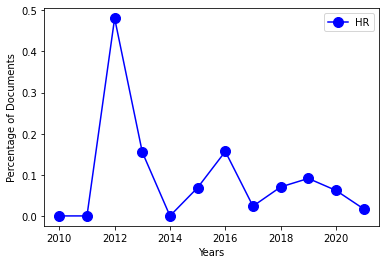

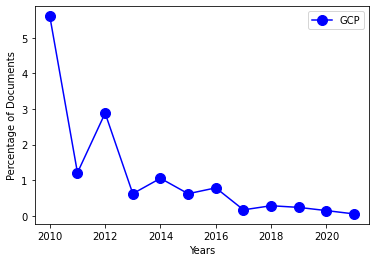

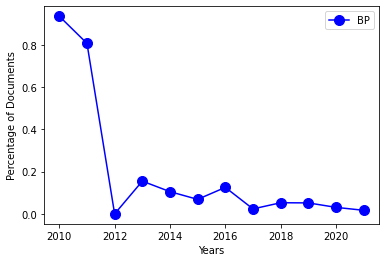

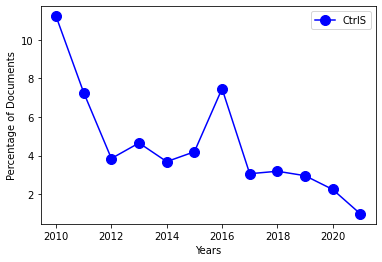

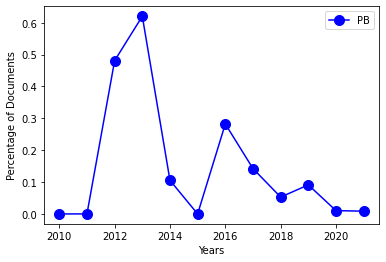

...

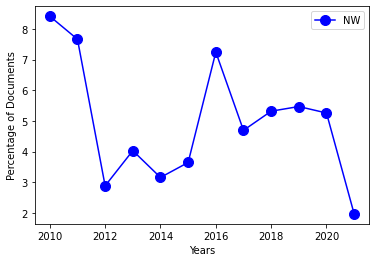

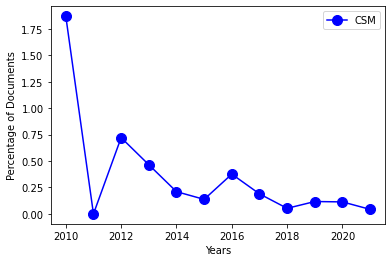

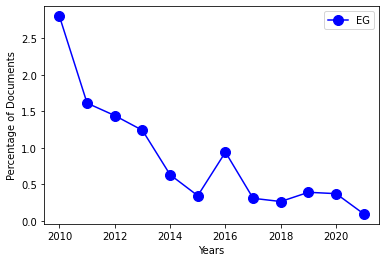

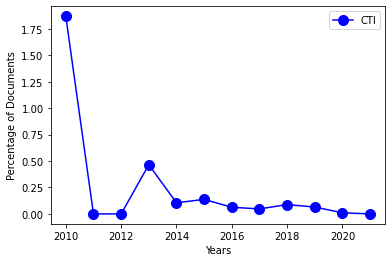

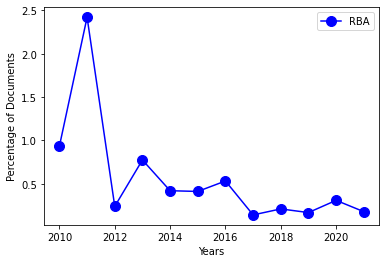

In [ ]:
#  Topic wise trend analysis across years
numTopics=11
years=12
year=[2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021]
arr=[107,141,168,229,305,504,1735,1030,1461,2000,2000,2000]
j = 1
while j<12:
  arr[j]=arr[j]+arr[j-1]
  # print(j)
  j=j+1
print(arr)
freq=[[0]*years for _ in range(numTopics)]
j=0
print(df)
s=[0]*11
for (i,j) in zip(df['Dominant_Topic'],df['Document_Id']) :
  s[i]+=1
  # print(type(i))
  if j<arr[0]:
    freq[i][0]+=1
  elif j<arr[1]:
    freq[i][1]+=1
  elif j<arr[2]:
    freq[i][2]+=1
  elif j<arr[3]:
    freq[i][3]+=1
  elif j<arr[4]:
    freq[i][4]+=1
  elif j<arr[5]:
    freq[i][5]+=1
  elif j<arr[6]:
    freq[i][6]+=1
  elif j<arr[7]:
    freq[i][7]+=1
  elif j<arr[8]:
    freq[i][8]+=1
  elif j<arr[9]:
    freq[i][9]+=1
  elif j<arr[10]:
    freq[i][10]+=1
  else:
    freq[i][11]=freq[i][11]+1
print(freq)
print(s)
for i in range(11):
  plt.plot(year,[(k/j)*100 for (k,j) in zip(freq[i],arr)],color='blue',marker='o',markersize=10,label=labels[i])
  plt.xlabel('Years')
  plt.ylabel('Percentage of Documents')
  plt.legend()
  plt.show()
